In [2]:
import os
import numpy as np
import pandas as pd

import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

In [6]:
import numpy as np
import pandas as pd
import os 

class make_folder_dataset:
    def __init__(self, folder_path:str, save_path) -> None:
        self.path = folder_path
        self.save_path = save_path
        self.num_lines_per_message = 130
        self.df = pd.DataFrame()
        self.df_dataset = pd.DataFrame()
        self.tau = ['tau_J0','tau_J1', 'tau_J2', 'tau_J3', 'tau_J4', 'tau_J5', 'tau_J6']
        self.tau_d = ['tau_J_d0','tau_J_d1', 'tau_J_d2', 'tau_J_d3', 'tau_J_d4', 'tau_J_d5', 'tau_J_d6']
        self.tau_ext =['tau_ext0','tau_ext1','tau_ext2','tau_ext3','tau_ext4','tau_ext5','tau_ext6']

        self.q = ['q0','q1','q2','q3','q4','q5','q6']
        self.q_d = ['q_d0','q_d1','q_d2','q_d3','q_d4','q_d5','q_d6']

        self.dq = ['dq0','dq1','dq2','dq3','dq4','dq5','dq6']
        self.dq_d = ['dq_d0','dq_d1','dq_d2','dq_d3','dq_d4','dq_d5','dq_d6']


        self.e = ['e0','e1','e2','e3','e4','e5','e6']
        self.de = ['de0','de1','de2','de3','de4','de5','de6']
        self.etau = ['etau_J0','etau_J1', 'etau_J2', 'etau_J3', 'etau_J4', 'etau_J5', 'etau_J6']
    
    def _extract_array(self, data_dict:dict, data_frame:str, header:list,  n:int):
            dof = 7
            x, y = data_frame[n].split(':')
            y = y.replace('[','')
            y = y.replace(']','')
            y = y.replace('\n','')

            y = y.split(',')
            for i in range(dof):
                data_dict[header[i]].append(float(y[i]))

    def extract_robot_data(self):
        # it extracts robot data from all_data.txt
        f = open(self.path + 'all_data.txt', 'r')
        lines = f.readlines()

        keywords = ['time'] + self.tau + self.tau_d + self.tau_ext + self.q + self.q_d + self.dq + self.dq_d 

        data_dict = dict.fromkeys(keywords)
        for i in keywords:
            data_dict[i]=[0]
        
        for i in range(int(len(lines)/self.num_lines_per_message)):
            data_frame = lines[i*self.num_lines_per_message:(i+1)*self.num_lines_per_message]
            
            x, y = data_frame[3].split(':')
            time_ = int(y)-int(int(y)/1000000)*1000000

            x, y = data_frame[4].split(':')
            time_ = time_+int(y)/np.power(10,9)

            data_dict['time'].append(time_)
            
            self._extract_array(data_dict,data_frame,self.tau, 25)
            self._extract_array(data_dict,data_frame,self.tau_d, 26)
            self._extract_array(data_dict,data_frame, self.tau_ext, 37)
            
            self._extract_array(data_dict,data_frame,self.q, 28)
            
            self._extract_array(data_dict,data_frame, self.q_d, 29)
            self._extract_array(data_dict,data_frame, self.dq, 30)
            self._extract_array(data_dict,data_frame, self.dq_d, 31)
        
       
        self.df = pd.DataFrame.from_dict(data_dict)
        self.df = self.df.drop(index=0).reset_index()
        
        for i in range(len(self.e)):
            self.df[self.e[i]] = self.df[self.q_d[i]]-self.df[self.q[i]]
        for i in range(len(self.de)):
            self.df[self.de[i]] = self.df[self.dq_d[i]]-self.df[self.dq[i]]
        for i in range(len(self.etau)):
            self.df[self.etau[i]] = self.df[self.tau_d[i]]-self.df[self.tau[i]]
        self.ros_time = self.df['time'][0]
        self.df.time = self.df.time-self.df.time[0]
        self.get_labels(self.df)
        self.df.to_csv(self.save_path + 'labeled_data.csv', index=False)
        #self.df.to_csv(self.save_path +'robot_data.csv',index=False)

    def get_labels(self, df):
        # it syncronize true labeled (contact- noncontact) data with robot data
        true_label = pd.read_csv(self.path+'true_label.csv')
        true_label['time'] = true_label['time_sec']+true_label['time_nsec']-self.ros_time
        time_dev = true_label['time'].diff()
        contact_events_index = np.append([0], true_label['time'][time_dev>0.05].index.values)
        contact_events_index = np.append(contact_events_index,  true_label['time'].shape[0]-1)
        
        contact_count = 0
        df['label']=0

        for i in range(df['time'].shape[0]):
            if (df['time'][i]-true_label['time'][contact_events_index[contact_count]]) > 0:
                #print(i ,',', contact_events_index[contact_count], ',',self.df['time'][i], '   ', true_label['time'][contact_events_index[contact_count]] )
                contact_count += 1
                if contact_count == len(contact_events_index):
                    break
                for j in range(i, df['time'].shape[0]):
                    df.loc[j, 'label'] = 1
                    #print(j)
                    if (df['time'][j] - true_label['time'][contact_events_index[contact_count]-1]) > 0:
                        #print(j ,',', contact_events_index[contact_count]-1, ',', self.df['time'][j], '   ', true_label['time'][contact_events_index[contact_count]-1] )
                        #print('----------------------------------------')
                        i = j
                        break
        
        return df

    def make_sequence(self):
        #window_time = 140ms
        seq_num = 28
        gap = 4
        selected_features= self.e + self.tau

        dataset = pd.DataFrame(np.ones((int((self.df.shape[0]-seq_num)/gap), seq_num*len(selected_features)+1))*2 )
        index = 0
        state = False
        last_contact_indexes = self.df.loc[self.df['label']==1,'index'].values
        last_contact_indexes = last_contact_indexes[last_contact_indexes.shape[0]-1]

        for i in range(0, last_contact_indexes, gap):
            if state: 
                window = self.df[selected_features][i:i+seq_num]
                dataset.iloc[index,0] = self.df['label'][i+seq_num]
                dataset.iloc[index, 1:len(dataset.columns)] = np.hstack(window.to_numpy())
                index += 1
            else:
                if self.df['label'][i+seq_num] == 1:
                    state = 1
        self.dataset = dataset.drop(index=dataset.loc[dataset[0]==2,0].index)

        name = self.path.split('/')[len(self.path.split('/'))-2]+'.csv'
        self.dataset.to_csv(self.save_path+name, index=False)
        return self.dataset
    
    def split_data(self, train_split_rate = 0.75):
        msk = np.random.rand(len(self.dataset)) < train_split_rate
        train = self.dataset.loc[msk, :]
        test = self.dataset.loc[~msk, :]
        name = self.path.split('/')[len(self.path.split('/'))-2]+'_train.csv'
        train.to_csv(self.save_path+name, index=False)

        name = self.path.split('/')[len(self.path.split('/'))-2]+'_test.csv'
        test.to_csv(self.save_path+name, index=False)

In [7]:
import os
data_path = '../DATA/'

# Specify the directory you want to list files for
robot_data_path = data_path + 'rawData/'
label_data_path = data_path
dataset_path = os.path.join(data_path,'Labeled_data/')
os.makedirs(dataset_path, exist_ok=True)

# Get a list of all files and directories in the specified directory
files_and_dirs = os.listdir(robot_data_path)
files_and_dirs = ['T-0912-1/']
for folder_name in files_and_dirs:

    folder_path = robot_data_path + folder_name
    
    save_data_file = dataset_path + folder_name
    os.makedirs(save_data_file, exist_ok=True)    
    data = make_folder_dataset(folder_path,save_data_file)
    data.extract_robot_data()
    #data.df.iplot(x='time', y=['label'])
    targetA = data.q
    targetB = data.q_d

    data.df.iplot(x='time', y = targetA+ targetB+['label'], xTitle='time (sec)')
    break
    

In [8]:
#data.true_label.time.plot()
robot_dof = 7
num_features = 4*robot_dof
time_seq = 28
num_columns = time_seq * num_features 

header = ['Time_sec', 'Time_nsec', 'prediction_duration', 'contact_out', 'collision_out', 'localization_out'] + [f'val_{i}' for i in range(num_columns)]

df_model_out= pd.read_csv(folder_path+'model_result.csv', names=header, skiprows=1 )
df_model_out.head()
df_model_out['time']=df_model_out.Time_sec+df_model_out.Time_nsec-data.ros_time

df_model_out=data.get_labels(df_model_out)

df_model_out['label2'] = df_model_out['label'] * 5

df_model_out.iplot(x='time', y=[ 'label2','contact_out'])
df_model_out.iplot(x='time', y='prediction_duration')

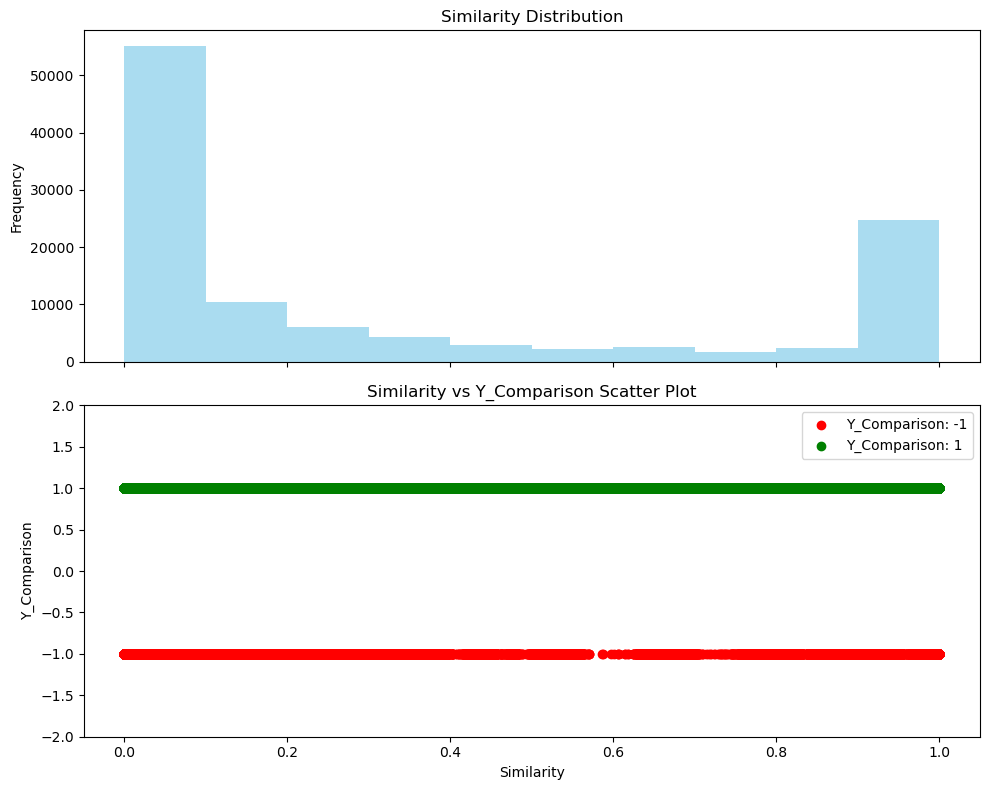

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 读取 CSV 文件
data = pd.read_csv("/Users/shangyu/Documents/GitHub/tactileGestureDetection/similarity_y_comparison.csv")

data
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# 绘制直方图
ax1.hist(data['Similarity'], bins=10, color='skyblue', alpha=0.7)
ax1.set_ylabel('Frequency')
ax1.set_title('Similarity Distribution')

# 绘制散点图
ax2.scatter(data[data['Y_Comparison'] == -1]['Similarity'],
            data[data['Y_Comparison'] == -1]['Y_Comparison'],
            color='red', label='Y_Comparison: -1')

ax2.scatter(data[data['Y_Comparison'] == 1]['Similarity'],
            data[data['Y_Comparison'] == 1]['Y_Comparison'],
            color='green', label='Y_Comparison: 1')

ax2.set_xlabel('Similarity')
ax2.set_ylabel('Y_Comparison')
ax2.set_ylim(-2, 2)
ax2.legend()
ax2.set_title('Similarity vs Y_Comparison Scatter Plot')

plt.tight_layout()
plt.show()


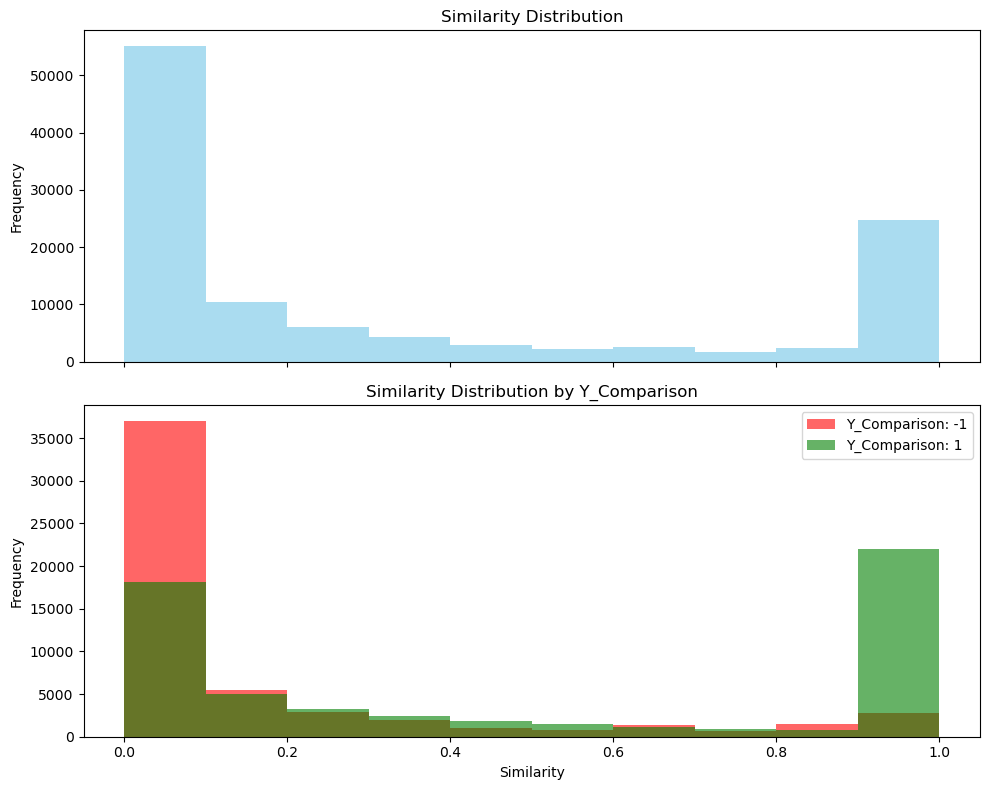

In [20]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# 绘制直方图
ax1.hist(data['Similarity'], bins=10, color='skyblue', alpha=0.7)
ax1.set_ylabel('Frequency')
ax1.set_title('Similarity Distribution')

# 绘制散点图
ax2.hist(data[data['Y_Comparison'] == -1]['Similarity'], bins=10, color='red', alpha=0.6, label='Y_Comparison: -1')
ax2.hist(data[data['Y_Comparison'] == 1]['Similarity'], bins=10, color='green', alpha=0.6, label='Y_Comparison: 1')

ax2.set_xlabel('Similarity')
ax2.set_ylabel('Frequency')
ax2.set_title('Similarity Distribution by Y_Comparison')
ax2.legend()


plt.tight_layout()
plt.show()